In [1]:
%matplotlib inline
import matplotlib as mpl
print(mpl.__version__)
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gaussian_kde_weights 
from scipy.stats import gaussian_kde
import pink_utils as pu
import astropy.units as u
from tqdm import tqdm
from collections import defaultdict
from astropy.coordinates import SkyCoord
from collections import Counter

2.2.2


In [2]:
FIRST_PIX = 1.8*u.arcsecond # Pixel size of FIRST survey. Square pixels
FIRST_FWHM = 5*u.arcsecond / FIRST_PIX
FIRST_SIG = FIRST_FWHM / 2.355

# Load the Required items in
df        = pd.read_csv('../Experiment/Experiment_F3W2_95_5/FIRST_Cata_Images.csv')
transform = pu.transform('../Experiment/Experiment_F3W2_95_5/F3W2_95_5_Transform_Matrix.bin')
ed        = pu.heatmap('../Experiment/Experiment_F3W2_95_5/F3W2_95_5_ED_Matrix.bin')
som       = pu.som('../Experiment/Experiment_F3W2_95_5/Results/F3W2_95_5/F3W2S_95_5_6.bin')
images    = pu.image_binary('../Experiment/Experiment_F3W2_95_5/Results/F3W2_95_5.bin')

print(FIRST_FWHM, FIRST_SIG)

2.7777777777777777 1.179523472517103


/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3018: DtypeWarning: Columns (73,74) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
som.file_head
NEURON_SIZE = som.file_head[-1] # Equal dimensions 

In [4]:
def apply_img_rotation(img, transform):
    img = img.T # Correct the C/Fortran mismatch of array formatting
    
    flip, angle = transform
    
    img = img_rotate(img, -np.rad2deg(angle), reshape=False)

    if flip == 1:
        img = img[:,::-1]
    
    return img
    
def return_transform(index, pos_min):
    rot = transform.transform(index=index).reshape(transform.header_info[1:])
    flip, ro = rot[pos_min[1], pos_min[0]][0]    

    return flip, ro

def return_bmu(index):
    hmap = ed.ed(index=index)
    pos_min = np.unravel_index(np.argmin(hmap), hmap.shape)

    return pos_min
    
def return_hmap_stats(index):
    hmap = ed.ed(index=index)
    stats = {'min': np.min(hmap),
             'max': np.max(hmap),
             'sum': np.sum(hmap)}

    return stats
    
def zoom(img, in_y, in_x):
    diff_x = in_x // 2
    diff_y = in_y // 2
    
    cen_x = img.shape[1] // 2
    cen_y = img.shape[0] // 2
    
    return img[cen_y-diff_y:cen_y+diff_y,
               cen_x-diff_x:cen_x+diff_x]

def pos_offset(row):
    r_pos  = SkyCoord(ra=row['radio.ra']*u.deg, dec=row['radio.dec']*u.deg, frame='icrs')
    ir_pos = SkyCoord(ra=row['consensus.ir_ra']*u.deg, dec=row['consensus.ir_dec']*u.deg, frame='icrs')
    
    return r_pos.spherical_offsets_to(ir_pos)

def rotate_offset(off_x, off_y, transform):
    flip, angle = transform
    
    off_y, off_x = off_x, off_y
    
    dx = off_x*np.cos(angle) - off_y*np.sin(angle)
    dy = off_x*np.sin(angle) + off_y*np.cos(angle)
    
    if flip == 1:
        dy = -dy
    
    return dx, dy


In [5]:
def new_entry():
    return {'tdx':[], 'tdy':[], 'rows':[], 'stats':[], 'rotation':[]}

dd = defaultdict(new_entry)

for (index, row) in tqdm(df.iterrows()):

    # Limit reached lets move on
    if index == 15000:
        break
    
    # Continue onto next source
    if row['consensus.ir_ra'] == -99:
        continue

    # Get rotation information
    # ---------------------------------------------------------
    bmu_pos = return_bmu(index)
    hmap_stats = return_hmap_stats(index)
    rotation = return_transform(index, bmu_pos)
    # ---------------------------------------------------------
    
    # Obtain position offsets
    # ---------------------------------------------------------
    offset = pos_offset(row)
    # RA moves right to left
    off_ra  = -(offset[0].to(u.arcsecond) / FIRST_PIX) + NEURON_SIZE // 2
    off_dec = offset[1].to(u.arcsecond) / FIRST_PIX + NEURON_SIZE // 2
    # ---------------------------------------------------------    

    # Apply image transform
    # ---------------------------------------------------------
    # RA moves right to left
    dx, dy = rotate_offset(-(offset[0].to(u.arcsecond) / FIRST_PIX),
                           offset[1].to(u.arcsecond) / FIRST_PIX,
                           rotation)
    dx = dx + NEURON_SIZE // 2
    dy = dy + NEURON_SIZE // 2
    # ---------------------------------------------------------
    
    # Save the information
    # ---------------------------------------------------------
    dd[bmu_pos]['tdx'].append(dx)
    dd[bmu_pos]['tdy'].append(dy)
    dd[bmu_pos]['rows'].append(row)
    dd[bmu_pos]['stats'].append(hmap_stats)
    dd[bmu_pos]['rotation'].append(rotation)
    # ---------------------------------------------------------
    

14991it [02:27, 85.41it/s] 

/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
14991it [02:40, 85.41it/s]/Users/gal16b/Documents/Postdoc_Work/PINK/Experiments_Three/Notebook/gaussian_kde_weights.py:290: RuntimeWarning: invalid value encountered in true_divide
  self._data_covariance /= (1 - np.sum(self.weights ** 2))
/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/numpy/linalg/linalg.py:2022: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/Users/gal16b/Documents/Postdoc_Work/PINK/Experiments_Three/Notebook/gaussian_kde_weights.py:295: RuntimeWarning: invalid value encountered in sqrt
  self._norm_factor = n

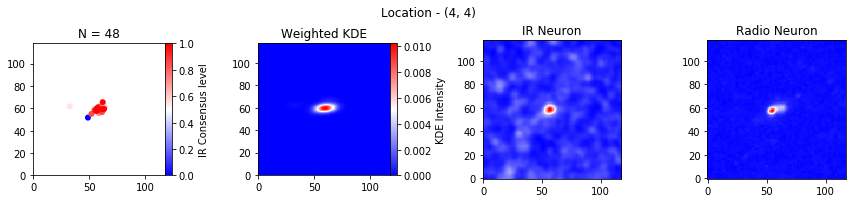

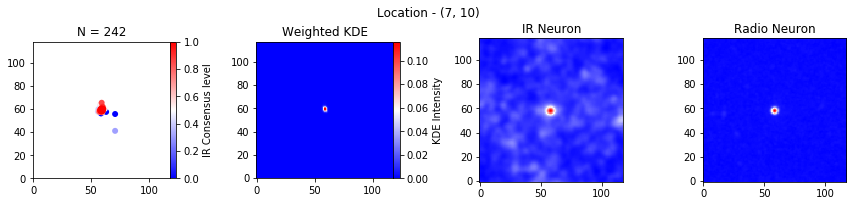

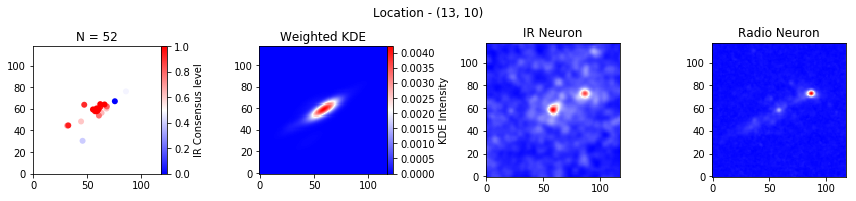

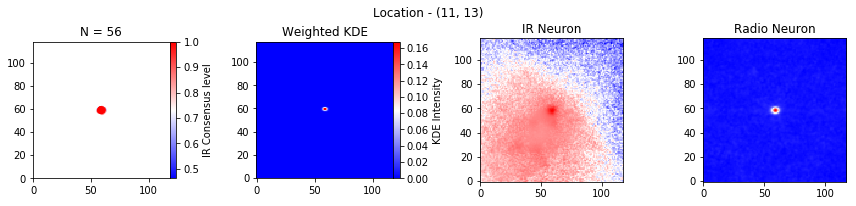

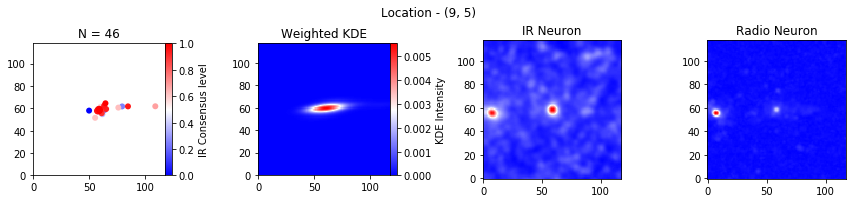

...

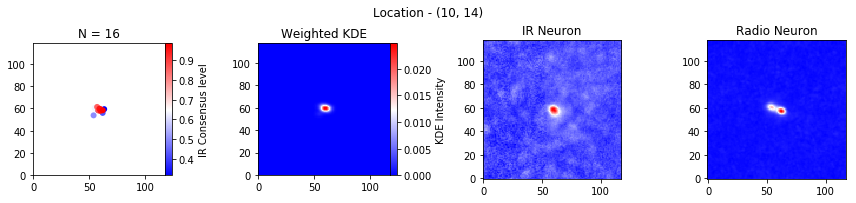

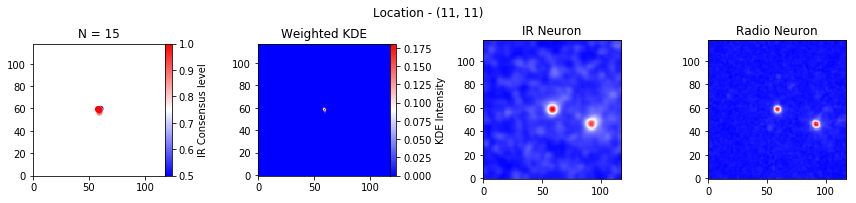

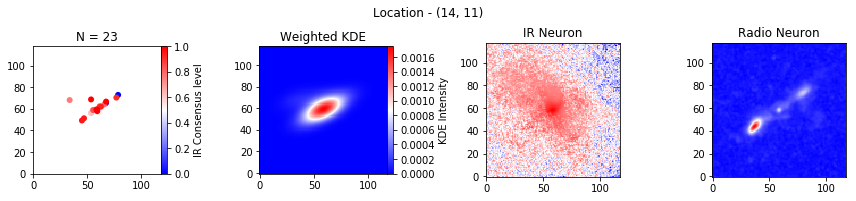

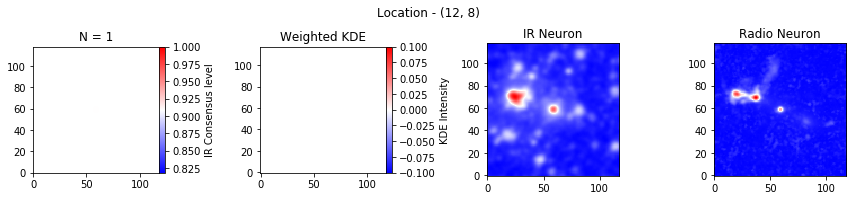

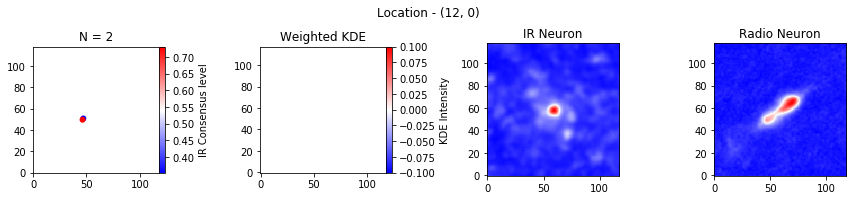

In [6]:
plt.close('all')

from mpl_toolkits.axes_grid1 import make_axes_locatable

for key in [ k for k in dd.keys()]:

    ir_neuron = som.get_neuron(x=key[0], y=key[1], channel=1)
    r_neuron = np.sqrt(som.get_neuron(x=key[0], y=key[1], channel=0))
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(12,3))
    
    # Calculate the point density
    tdx = np.array(dd[key]['tdx'])
    tdy = np.array(dd[key]['tdy'])
    tdweights = [i['consensus.ir_level'] for i in dd[key]['rows']]
    
    xy = np.vstack([tdx, tdy])
    kde = gaussian_kde_weights.gaussian_kde(xy, weights=tdweights, bw_method=FIRST_SIG.value)
    tdz = kde(xy)
    tdz = np.array(tdweights)
    
    # Sort by density
    index = tdz.argsort()
    tdx, tdy, tdz = tdx[index], tdy[index], tdz[index]
    
    # Make space for colorbar
    divider = make_axes_locatable(ax1)
    cax1 = divider.append_axes('right', size='5%')
    
    s = ax1.scatter(tdx, tdy, c=tdz, edgecolor='', cmap='bwr')
    ax1.set_xlim((0, NEURON_SIZE))
    ax1.set_ylim((0, NEURON_SIZE))
    ax1.set_aspect('equal')
    ax1.set(title=f"N = {len(tdx)}")
    
    cbar = fig.colorbar(s, cax=cax1, label='IR Consensus level')
    
    # Make a mesh grid to evaluate the KDE
    x = np.arange(0, ir_neuron.shape[0], 1)
    y = np.arange(0, ir_neuron.shape[1], 1)
    xx, yy = np.meshgrid(x, y)
    zz = kde((np.ravel(xx), np.ravel(yy))).reshape(ir_neuron.shape)
    
    # Make space for colorbar
    divider = make_axes_locatable(ax2)
    cax2 = divider.append_axes('right', size='5%')
    
    im = ax2.imshow(zz, origin='lower left', cmap='bwr')
    ax2.set_aspect('equal')
    ax2.set(title='Weighted KDE')
    
    cbar2 = fig.colorbar(im, cax=cax2, label='KDE Intensity')
    
    ax3.imshow(ir_neuron, cmap='bwr', origin='lower left')
    ax3.set_aspect('equal')
    ax3.set(title='IR Neuron')
    
    ax4.imshow(r_neuron, cmap='bwr', origin='lower left')
    ax4.set_aspect('equal')
    ax4.set(title='Radio Neuron')
    
    fig.suptitle(f"Location - {key}")
    fig.tight_layout()
    fig.savefig(f"Images/IR_Offset/{key}.pdf")

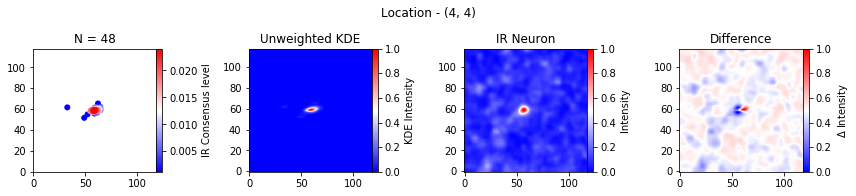

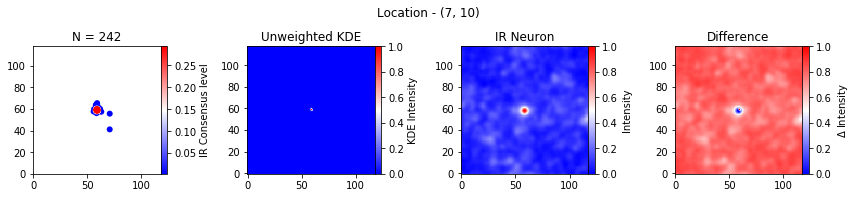

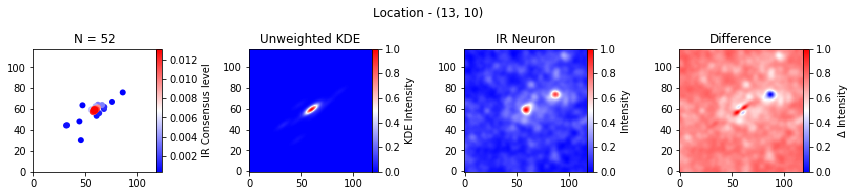

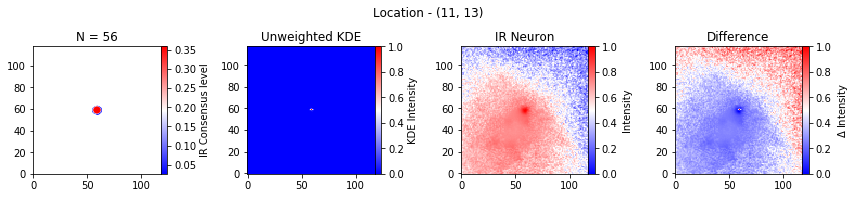

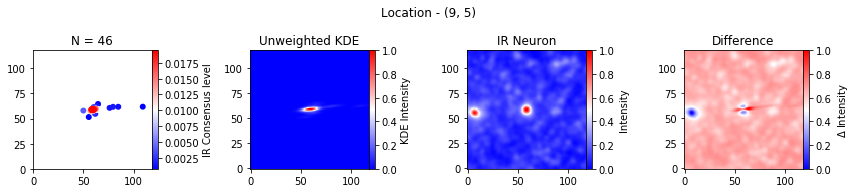

...

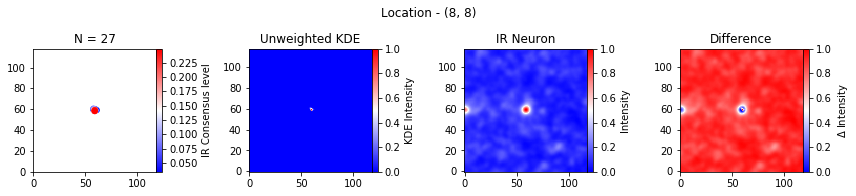

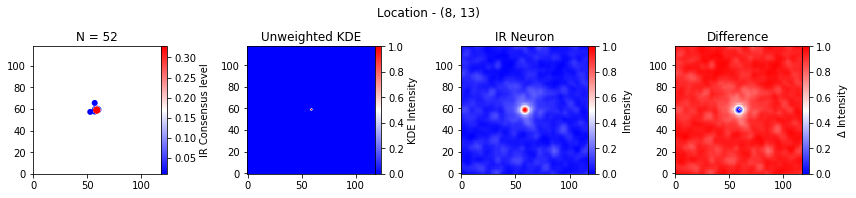

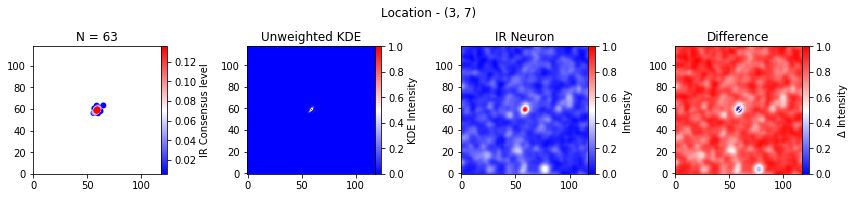

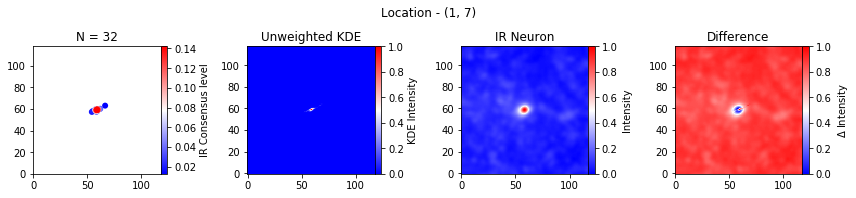

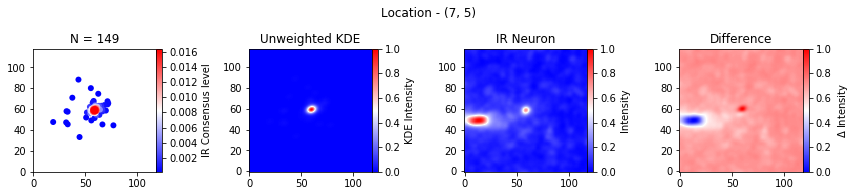

In [10]:
plt.close('all')


def minmax_img(img):
    return (img - img.min())/(img.max() - img.min())

from mpl_toolkits.axes_grid1 import make_axes_locatable

for key in [ k for k in dd.keys()][:20]:

    ir_neuron = minmax_img(som.get_neuron(x=key[0], y=key[1], channel=1))
    r_neuron = np.sqrt(som.get_neuron(x=key[0], y=key[1], channel=0))
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(12,3))
    
    # Calculate the point density
    tdx = np.array(dd[key]['tdx'])
    tdy = np.array(dd[key]['tdy'])
    tdweights = [i['consensus.ir_level'] for i in dd[key]['rows']]
    
    xy = np.vstack([tdx, tdy])
#     kde = gaussian_kde_weights.gaussian_kde(xy, weights=tdweights, bw_method=FIRST_SIG.value)
    kde = gaussian_kde(xy)
    tdz = kde(xy)
#     tdz = np.array(tdweights)
    
    # Sort by density
    index = tdz.argsort()
    tdx, tdy, tdz = tdx[index], tdy[index], tdz[index]
    
    # Make space for colorbar
    divider = make_axes_locatable(ax1)
    cax1 = divider.append_axes('right', size='5%')
    
    s = ax1.scatter(tdx, tdy, c=tdz, edgecolor='', cmap='bwr')
    ax1.set_xlim((0, NEURON_SIZE))
    ax1.set_ylim((0, NEURON_SIZE))
    ax1.set_aspect('equal')
    ax1.set(title=f"N = {len(tdx)}")
    
    cbar = fig.colorbar(s, cax=cax1, label='IR Consensus level')
    
    # Make a mesh grid to evaluate the KDE
    x = np.arange(0, ir_neuron.shape[0], 1)
    y = np.arange(0, ir_neuron.shape[1], 1)
    xx, yy = np.meshgrid(x, y)
    zz = minmax_img(kde((np.ravel(xx), np.ravel(yy))).reshape(ir_neuron.shape))
    
    # Make space for colorbar
    divider = make_axes_locatable(ax2)
    cax2 = divider.append_axes('right', size='5%')
    
    im = ax2.imshow(zz, origin='lower left', cmap='bwr')
    ax2.set_aspect('equal')
    ax2.set(title='Unweighted KDE')
    
    cbar2 = fig.colorbar(im, cax=cax2, label='KDE Intensity')
    
    
    # Make space for colorbar
    divider = make_axes_locatable(ax3)
    cax3 = divider.append_axes('right', size='5%')
    
    ax3.imshow(ir_neuron, cmap='bwr', origin='lower left')
    ax3.set_aspect('equal')
    ax3.set(title='IR Neuron')
    cbar3 = fig.colorbar(im, cax=cax3, label='Intensity')
    
    
    # Make space for colorbar
    divider = make_axes_locatable(ax4)
    cax4 = divider.append_axes('right', size='5%')
    
    ax4.imshow(zz-ir_neuron, cmap='bwr', origin='lower left')
    ax4.set_aspect('equal')
    ax4.set(title='Difference')
    cbar4 = fig.colorbar(im, cax=cax4, label='$\Delta$ Intensity')
    

    fig.suptitle(f"Location - {key}")
    fig.tight_layout()
    fig.show()
#     fig.savefig(f"Images/IR_Offset/{key}.pdf")

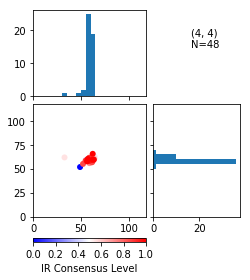

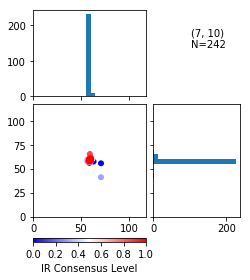

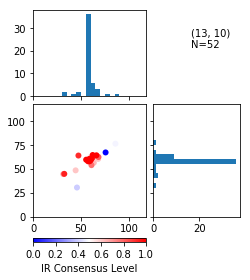

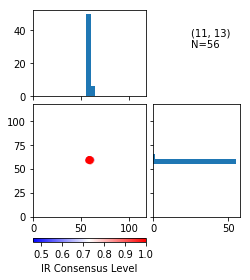

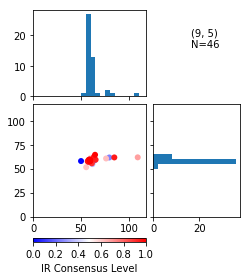

...

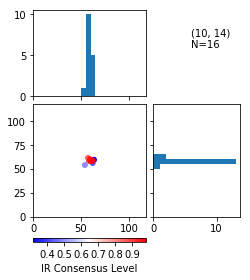

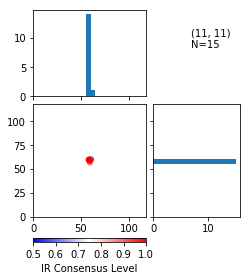

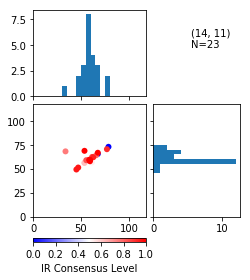

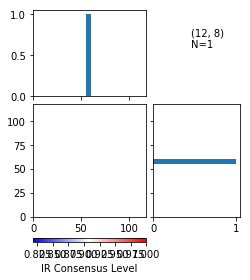

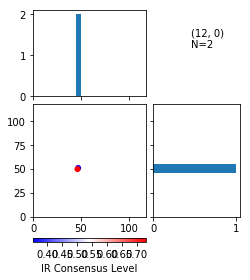

In [8]:
plt.close('all')


def minmax_img(img):
    return (img - img.min())/(img.max() - img.min())

from mpl_toolkits.axes_grid1 import make_axes_locatable

bins = np.arange(0, NEURON_SIZE, 5)

for key in [ k for k in dd.keys()]:
    
    fig, ax = plt.subplots(1,1)
    
    # Calculate the point density
    tdx = np.array(dd[key]['tdx'])
    tdy = np.array(dd[key]['tdy'])
    tdweights = [i['consensus.ir_level'] for i in dd[key]['rows']]
    tdz = np.array(tdweights)
    
    # Sort by weights
    index = tdz.argsort()
    tdx, tdy, tdz = tdx[index], tdy[index], tdz[index]
    
    
    im = ax.scatter(tdx, tdy, c=tdz, edgecolor='', cmap='bwr')

    divider = make_axes_locatable(ax)
    ax_histx = divider.append_axes('top', size=1.2, pad=0.1, sharex=ax)
    ax_histy = divider.append_axes('right', size=1.2, pad=0.1, sharey=ax)
    cax = divider.append_axes('bottom', size=0.05, pad=0.3)
    
    
    ax_histx.hist(tdx, bins=bins)
    plt.setp(ax_histx.get_xticklabels(), visible=False)
    
    ax_histy.hist(tdy, bins=bins, orientation='horizontal')
    plt.setp(ax_histy.get_yticklabels(), visible=False)
    
    
    fig.colorbar(im, cax=cax, orientation='horizontal', label='IR Consensus Level')
    
    ax.set_xlim((0, NEURON_SIZE))
    ax.set_ylim((0, NEURON_SIZE))
    ax.set_aspect(1.)
    
    ax.text(1.4, 1.5, f'{key} \nN={len(tdx)}', transform=ax.transAxes)
    
    fig.tight_layout()
    fig.savefig(f"Images/IR_Offset/{key}_histogram.pdf")